In [1]:
from __future__ import print_function
import matplotlib.pyplot as plt

import os
from PIL import Image
import numpy as np
from models import *
import torchvision.transforms as transforms
import torch
import torch.optim

from skimage.metrics import peak_signal_noise_ratio
from utils.denoising_utils import *

torch.backends.cudnn.enabled = True
torch.backends.cudnn.benchmark =True
dtype = torch.cuda.FloatTensor

imsize =-1
PLOT = True
sigma = 25
sigma_ = sigma/255.

fname = 'data\\denoising\\IMG_1133.jpg'

#   **Original DIP training**
-   preparing model and hyperparameters

In [2]:
# Add synthetic noise
img_pil = Image.open(fname).resize((512, 512))
# img_pil = crop_image(get_image(fname, imsize)[0], d=32)
img_np = pil_to_np(img_pil)

img_noisy_pil, img_noisy_np = get_noisy_image(img_np, sigma_)

INPUT = 'noise' # 'meshgrid'
pad = 'reflection'
OPT_OVER = 'net' # 'net,input'

reg_noise_std = 1./30. # set to 1./20. for sigma=50
LR = 0.01

OPTIMIZER='adam' # 'LBFGS'
show_every = 100
exp_weight=0.99

num_iter = 1000
input_depth = 32
figsize = 4 

net = get_net(input_depth, 'skip', pad,
                skip_n33d=128, 
                skip_n33u=128, 
                skip_n11=4, 
                num_scales=5,
                upsample_mode='bilinear').type(dtype)

net_input = get_noise(input_depth, INPUT, (img_pil.size[1], img_pil.size[0])).type(dtype).detach()

# Compute number of parameters
s  = sum([np.prod(list(p.size())) for p in net.parameters()]); 
print ('Number of params: %d' % s)

# Loss
mse = torch.nn.MSELoss().type(dtype)

img_noisy_torch = np_to_torch(img_noisy_np).type(dtype)

Number of params: 2217831


In [3]:
net_input_saved = net_input.detach().clone()
noise = net_input.detach().clone()
out_avg = None
last_net = None
psrn_noisy_last = 0
priors = []
loss_list = []
i = 0
def original_training():
    print('Showing training target')
    if PLOT:
        plot_image_grid([img_np, img_noisy_np], 4, 6);
    def train():
        
        global i, out_avg, psrn_noisy_last, last_net, net_input
        
        if reg_noise_std > 0:
            net_input = net_input_saved + (noise.normal_() * reg_noise_std)
        
        out = net(net_input)
        
        # Smoothing
        if out_avg is None:
            out_avg = out.detach()
        else:
            out_avg = out_avg * exp_weight + out.detach() * (1 - exp_weight)
                
        total_loss = mse(out, img_noisy_torch)
        total_loss.backward()
            
        
        psrn_noisy = peak_signal_noise_ratio(img_noisy_np, out.detach().cpu().numpy()[0]) 
        psrn_gt    = peak_signal_noise_ratio(img_np, out.detach().cpu().numpy()[0]) 
        psrn_gt_sm = peak_signal_noise_ratio(img_np, out_avg.detach().cpu().numpy()[0]) 
        
        # Note that we do not have GT for the "snail" example
        # So 'PSRN_gt', 'PSNR_gt_sm' make no sense
        loss_list.append(total_loss.item())
        print ('Iteration %05d    Loss %f   PSNR_noisy: %f   PSRN_gt: %f PSNR_gt_sm: %f' % (i, total_loss.item(), psrn_noisy, psrn_gt, psrn_gt_sm), '\r', end='')
        if  PLOT and i % show_every == 0:
            out_np = torch_to_np(out)
            plot_image_grid([np.clip(out_np, 0, 1), 
                            np.clip(torch_to_np(out_avg), 0, 1)], nrow=2)
            priors.append(out_np)
            
        
        # Backtracking
        if i % show_every:
            if psrn_noisy - psrn_noisy_last < -5: 
                print('Falling back to previous checkpoint.')

                for new_param, net_param in zip(last_net, net.parameters()):
                    net_param.data.copy_(new_param.cuda())

                return total_loss*0
            else:
                last_net = [x.detach().cpu() for x in net.parameters()]
                psrn_noisy_last = psrn_noisy
                
        i += 1

        return total_loss

    p = get_params(OPT_OVER, net, net_input)
    optimize(OPTIMIZER, p, train, LR, num_iter)

Showing training target


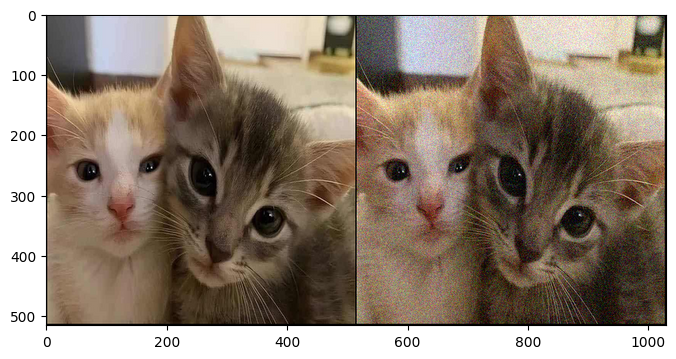

Starting optimization with ADAM


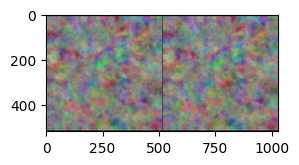

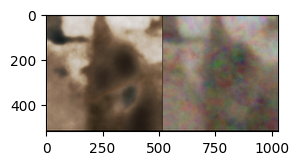

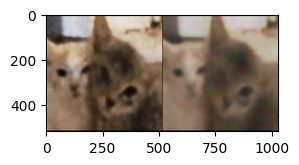

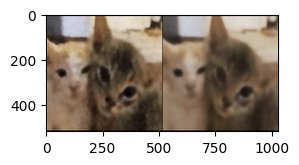

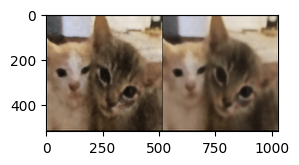

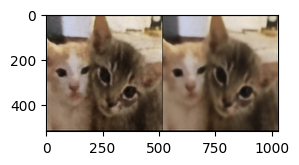

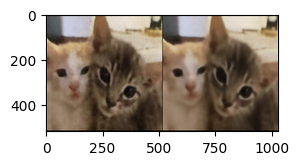

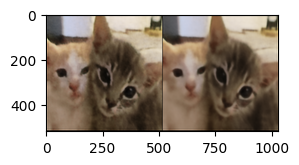

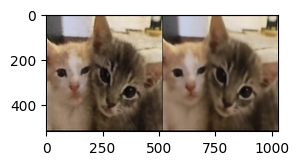

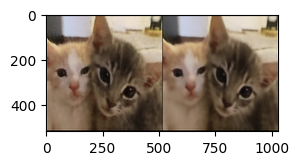

In [4]:
original_training()

Original Result: model pred(left), ground truth(right)
PSNR: 28.684494237210124


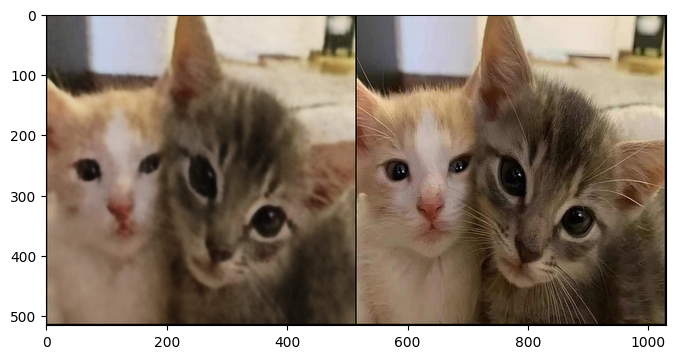

In [5]:
print('Original Result: model pred(left), ground truth(right)')
img_pil = Image.open(fname).resize((512, 512))
img_np = pil_to_np(img_pil)

img_noisy_pil, img_noisy_np = get_noisy_image(img_np, sigma_)
out_np = torch_to_np(net(net_input))
ori_PSNR = peak_signal_noise_ratio(img_np, np.clip(out_np, 0, 1))
print(f'PSNR: {ori_PSNR}')
q = plot_image_grid([np.clip(out_np, 0, 1), img_np], factor=6);

#   **Hierarchical DIP Training**
-   Create noisy image sequence

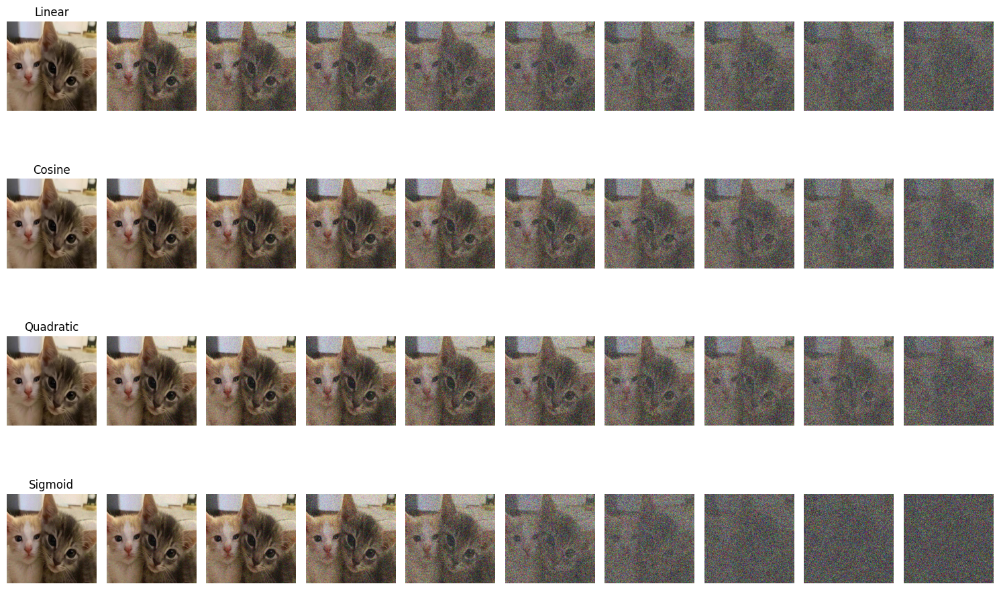

In [6]:
def add_noise(image, beta_schedule, t):
    noise = torch.randn_like(image)
    beta_t = beta_schedule[t]
    alpha_t = 1 - beta_t
    noisy_image = torch.sqrt(alpha_t) * image + torch.sqrt(1 - alpha_t) * noise
    return noisy_image, noise

# 讀取圖像並轉換為張量
image_path = 'data\\denoising\\IMG_1133.jpg'  # 替換為你的圖像路徑
image = Image.open(image_path).resize((512, 512))
to_tensor = transforms.ToTensor()
input_tensor = to_tensor(image).unsqueeze(0)

T = 1000  # 總步數
lin_betas = torch.linspace(0.0001, 1.0, T)  # 線性調度
cos_betas = 1.0 * (1 - torch.cos(torch.linspace(0, np.pi / 2, T)))  # 調整餘弦調度  # 餘弦調度
qud_betas = torch.linspace(0.0001, 1.0, T) ** 2  # 二次調度
sig_betas = torch.sigmoid(torch.linspace(-6, 6, T)) * 1.0  # Sigmoid 調度

beta_schedules = [lin_betas, cos_betas, qud_betas, sig_betas]
schedule_names = ['Linear', 'Cosine', 'Quadratic', 'Sigmoid']
num_images = 10
stepsize = T // num_images
fig, axs = plt.subplots(len(beta_schedules), num_images, figsize=(15, 10))

priors = []
for row_idx, betas in enumerate(beta_schedules):
    image = input_tensor.clone().to('cuda' if torch.cuda.is_available() else 'cpu')
    for col_idx in range(num_images):
        t = col_idx * stepsize
        noisy_image, noise = add_noise(image, betas, t)
        priors.append(np.clip(noisy_image[0].cpu().numpy(), 0, 1))
        axs[row_idx, col_idx].imshow(np.clip(noisy_image[0].cpu().permute(1, 2, 0).numpy(), 0, 1))
        axs[row_idx, col_idx].axis('off')
        if col_idx == 0:
            axs[row_idx, col_idx].set_title(schedule_names[row_idx])

plt.tight_layout()
plt.show()

### **uncomment to change beta schedules**

In [7]:
# linear schedule
priors = priors[:10]
# cosine schedule
# priors = priors[10:20]
# quadratic schedule
# priors = priors[20:30]
# sigmoid schedule
# priors = priors[30:]

### **preparing model and hyperparameters**

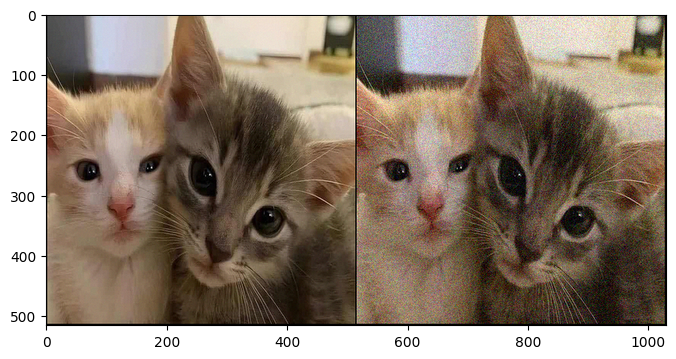

Number of params: 2217831


In [8]:
img_np = priors[0]
img_np = np.clip(img_np, 0, 1)
img_noisy_pil, img_noisy_np = get_noisy_image(img_np, sigma_)

if PLOT:
    plot_image_grid([img_np, img_noisy_np], 4, 6);

INPUT = 'noise' # 'meshgrid'
pad = 'reflection'
OPT_OVER = 'net' # 'net,input'

reg_noise_std = 1./30. # set to 1./20. for sigma=50
LR = 0.01

OPTIMIZER='adam' # 'LBFGS'
show_every = 200
exp_weight=0.99

num_iter = 1000
input_depth = 32
figsize = 4 


net = get_net(input_depth, 'skip', pad,
                skip_n33d=128, 
                skip_n33u=128, 
                skip_n11=4, 
                num_scales=5,
                upsample_mode='bilinear').type(dtype)

    
net_input = get_noise(input_depth, INPUT, (512, 512), noise_type='n').type(dtype).detach()

# Compute number of parameters
s  = sum([np.prod(list(p.size())) for p in net.parameters()]); 
print ('Number of params: %d' % s)

# Loss
mse = torch.nn.MSELoss().type(dtype)

img_noisy_torch = np_to_torch(img_noisy_np).type(dtype)

### **main training loop**

In [9]:
total_iterations = 1000
stages = 10

# 計算每個stage的iteration數量的增加量
increase_per_stage = 2 * total_iterations / (stages * (stages + 1))

# 初始化變量來保存每個stage的iteration數量
iterations_per_stage = []

for i in range(1, stages + 1):
    iterations = int(i * increase_per_stage)
    iterations_per_stage.append(iterations)

print(iterations_per_stage)


[18, 36, 54, 72, 90, 109, 127, 145, 163, 181]


starting progressive learning with 5 stage generated priors shown below...


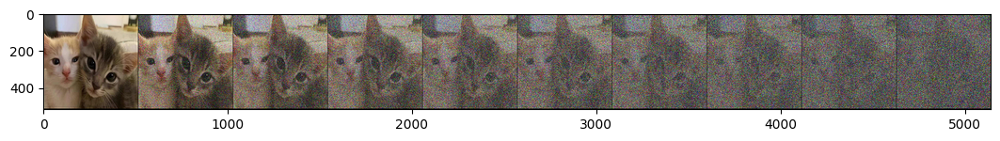

Stage 1

below is model training target


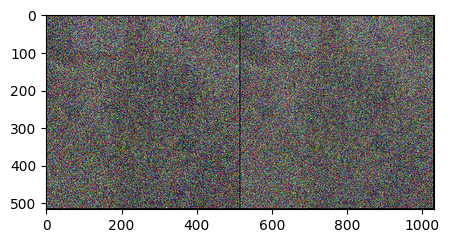

below is model outputss 0.176219   PSNR_noisy: 7.539473   PSRN_gt: 7.079679 PSNR_gt_sm: 7.079679 


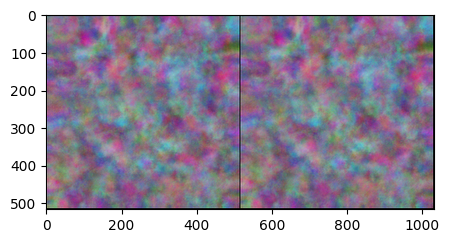

Stage 2on 00017    Loss 0.149499   PSNR_noisy: 8.253622   PSRN_gt: 7.785212 PSNR_gt_sm: 7.275795 

below is model training target


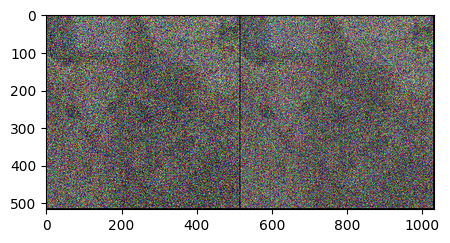

below is model outputss 0.149474   PSNR_noisy: 8.254332   PSRN_gt: 7.802210 PSNR_gt_sm: 7.802210 


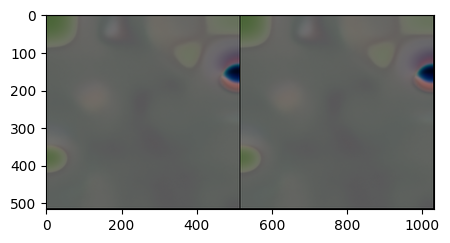

Stage 3on 00035    Loss 0.148003   PSNR_noisy: 8.297294   PSRN_gt: 7.842942 PSNR_gt_sm: 7.819696 

below is model training target


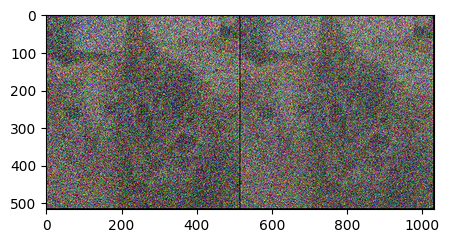

below is model outputss 0.145881   PSNR_noisy: 8.360025   PSRN_gt: 7.923048 PSNR_gt_sm: 7.923048 


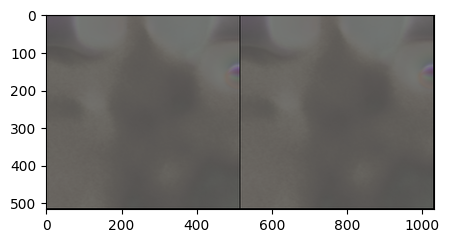

Stage 4on 00053    Loss 0.144934   PSNR_noisy: 8.388305   PSRN_gt: 7.949911 PSNR_gt_sm: 7.932553 

below is model training target


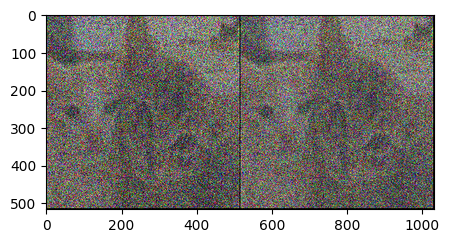

below is model outputss 0.141900   PSNR_noisy: 8.480169   PSRN_gt: 8.064576 PSNR_gt_sm: 8.064576 


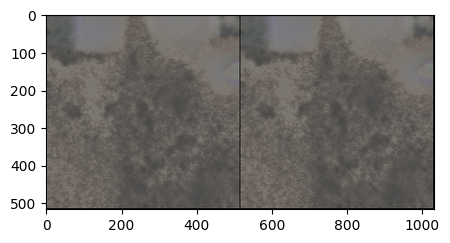

Stage 5on 00071    Loss 0.139698   PSNR_noisy: 8.548105   PSRN_gt: 8.128259 PSNR_gt_sm: 8.093061 

below is model training target


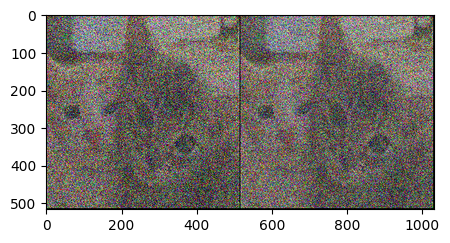

below is model outputss 0.137268   PSNR_noisy: 8.624314   PSRN_gt: 8.236846 PSNR_gt_sm: 8.236846 


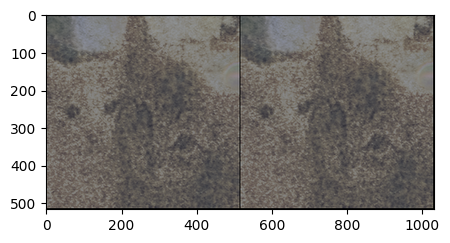

Stage 6on 00089    Loss 0.132891   PSNR_noisy: 8.765028   PSRN_gt: 8.372224 PSNR_gt_sm: 8.309974 

below is model training target


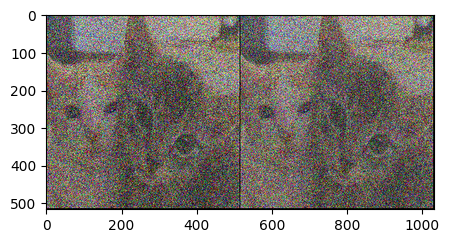

below is model outputss 0.130498   PSNR_noisy: 8.843978   PSRN_gt: 8.494120 PSNR_gt_sm: 8.494120 


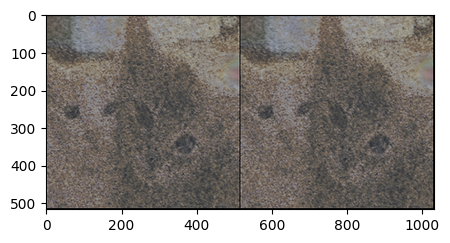

Stage 7on 00108    Loss 0.122849   PSNR_noisy: 9.106278   PSRN_gt: 8.747699 PSNR_gt_sm: 8.645574 

below is model training target


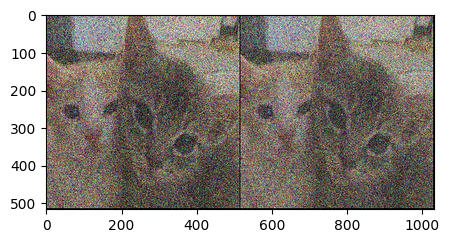

below is model outputss 0.121565   PSNR_noisy: 9.151900   PSRN_gt: 8.856319 PSNR_gt_sm: 8.856319 


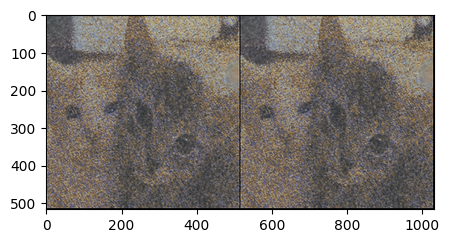

Stage 8on 00126    Loss 0.109669   PSNR_noisy: 9.599178   PSRN_gt: 9.287708 PSNR_gt_sm: 9.161514 

below is model training target


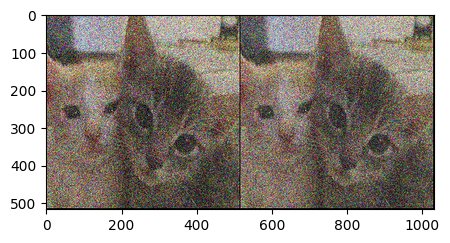

below is model outputss 0.106733   PSNR_noisy: 9.717026   PSRN_gt: 9.530774 PSNR_gt_sm: 9.530774 


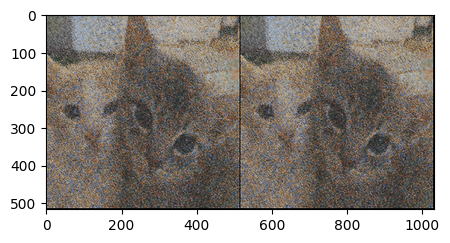

Stage 9on 00144    Loss 0.091831   PSNR_noisy: 10.370130   PSRN_gt: 10.157146 PSNR_gt_sm: 10.023639 

below is model training target


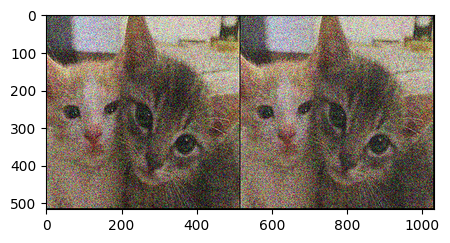

below is model outputss 0.077533   PSNR_noisy: 11.105153   PSRN_gt: 11.140431 PSNR_gt_sm: 11.140431 


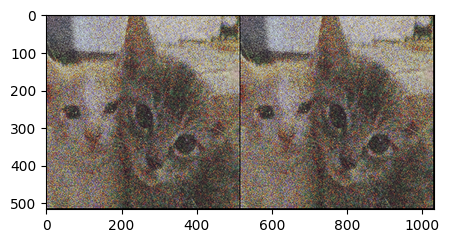

Stage 10n 00162    Loss 0.063652   PSNR_noisy: 11.961904   PSRN_gt: 11.992225 PSNR_gt_sm: 11.862330 

below is model training target


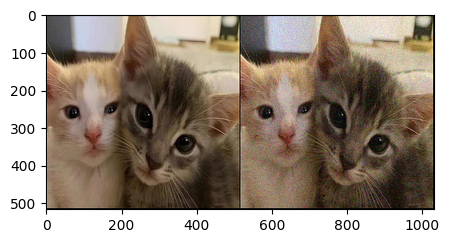

below is model outputss 0.018764   PSNR_noisy: 17.266704   PSRN_gt: 19.954464 PSNR_gt_sm: 19.954464 


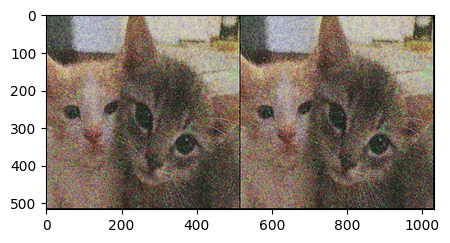

In [10]:
net_input_saved = net_input.detach().clone()
noise = net_input.detach().clone()
out_avg = None
last_net = None
psrn_noisy_last = 0
h_loss_list = []
net = get_net(input_depth, 'skip', pad,
                  skip_n33d=128, 
                  skip_n33u=128, 
                  skip_n11=4, 
                  num_scales=5,
                  upsample_mode='bilinear').type(dtype)
p = get_params(OPT_OVER, net, net_input)
optimizer = torch.optim.Adam(p, lr=LR)
STAGE = 10
print('starting progressive learning with 5 stage generated priors shown below...')

plot_image_grid(priors, factor=3, nrow=10)

for stage in reversed(range(STAGE)):
    print(f'Stage {STAGE - stage}')
    print()
    num_iter = iterations_per_stage[STAGE - stage - 1]
    show_every = num_iter
    img_np = priors[stage]
    img_noisy_pil, img_noisy_np = get_noisy_image(img_np, sigma_)
    img_noisy_torch = np_to_torch(img_noisy_np).type(dtype)
    out_avg = None
    last_net = None
    psrn_noisy_last = 0
    i=0
    def closure():
        global i, out_avg, psrn_noisy_last, last_net, net_input

        if reg_noise_std > 0:
            net_input = net_input_saved + (noise.normal_() * reg_noise_std)

        out = net(net_input)

        # Smoothing
        if out_avg is None:
            out_avg = out.detach()
        else:
            out_avg = out_avg * exp_weight + out.detach() * (1 - exp_weight)

        total_loss = mse(out, img_noisy_torch)
        total_loss.backward()


        psrn_noisy = peak_signal_noise_ratio(img_noisy_np, out.detach().cpu().numpy()[0]) 
        psrn_gt    = peak_signal_noise_ratio(img_np, out.detach().cpu().numpy()[0]) 
        psrn_gt_sm = peak_signal_noise_ratio(img_np, out_avg.detach().cpu().numpy()[0]) 

        # Note that we do not have GT for the "snail" example
        # So 'PSRN_gt', 'PSNR_gt_sm' make no sense
        h_loss_list.append(total_loss.item())
        print ('Iteration %05d    Loss %f   PSNR_noisy: %f   PSRN_gt: %f PSNR_gt_sm: %f' % (i, total_loss.item(), psrn_noisy, psrn_gt, psrn_gt_sm), '\r', end='')
        if  PLOT and i % show_every == 0:
            out_np = torch_to_np(out)
            print('below is model output')
            plot_image_grid([np.clip(out_np, 0, 1), 
                            np.clip(torch_to_np(out_avg), 0, 1)], factor=3, nrow=2)
            priors.append(out_np)

        # Backtracking
        if i % show_every:
            if psrn_noisy - psrn_noisy_last < -5: 
                print('Falling back to previous checkpoint.')

                for new_param, net_param in zip(last_net, net.parameters()):
                    net_param.data.copy_(new_param.cuda())

                return total_loss*0
            else:
                last_net = [x.detach().cpu() for x in net.parameters()]
                psrn_noisy_last = psrn_noisy

        i += 1

        return total_loss
    print('below is model training target')
    plot_image_grid([img_np, img_noisy_np], factor=3, nrow=2)
    for j in range(num_iter):
        optimizer.zero_grad()
        closure()
        optimizer.step()

Hierarchical Result: model pred(left), ground truth(right)
PSNR: 30.301893047737707


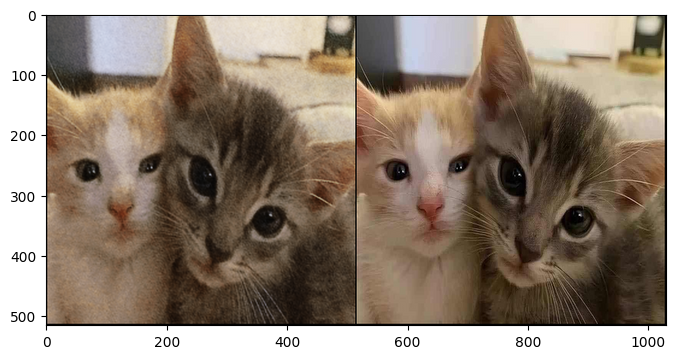

In [11]:
print('Hierarchical Result: model pred(left), ground truth(right)')
img_pil = Image.open(fname).resize((512, 512))
img_np = pil_to_np(img_pil)
img_noisy_pil, img_noisy_np = get_noisy_image(img_np, sigma_)
out_np = torch_to_np(net(net_input))
hie_PSNR = peak_signal_noise_ratio(img_np, np.clip(out_np, 0, 1))
print(f'PSNR: {hie_PSNR}')
q = plot_image_grid([np.clip(out_np, 0, 1), img_np], factor=6);

Text(0.5, 1.0, 'Loss Reduction')

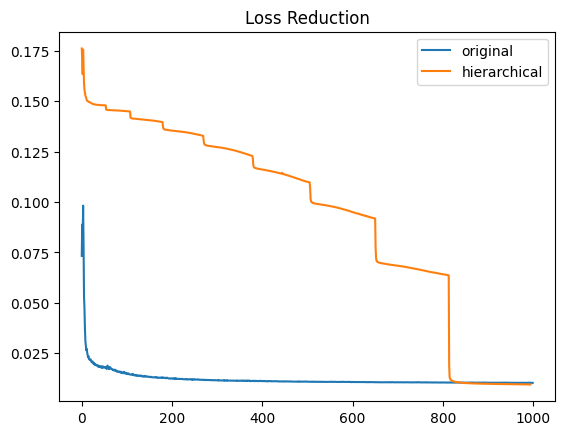

In [12]:
plt.plot(loss_list, label='original')
plt.plot(h_loss_list, label='hierarchical')
plt.legend()
plt.title('Loss Reduction')

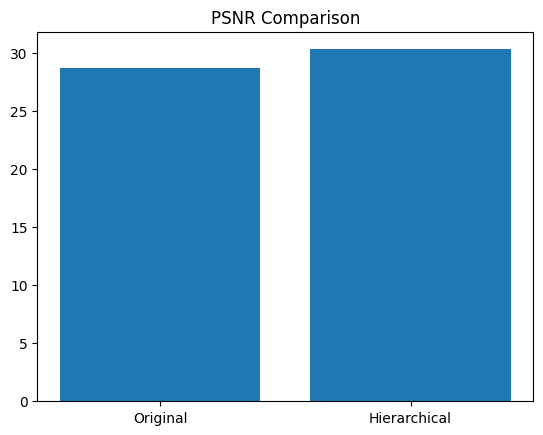

In [13]:
x = ['Original', 'Hierarchical']        # 水平資料點
h = [ori_PSNR, hie_PSNR]   # 高度
plt.bar(x,h)
plt.title('PSNR Comparison')
plt.show()